In [72]:
import pprint
import copy
import corner
import emcee
import matplotlib.pyplot as plt
import numpy as np
from george.gp import LinAlgError
import yaml
from matplotlib import cm
import rv_analysis_tools as rv
import importlib
importlib.reload(rv)
from astropy.timeseries import LombScargle
import dynesty
from dynesty import plotting as dyplot
import radvel
import pandas as pd

## Target selection

In [73]:
print('Welcome to the joint RV analysis tool!')
print('Which star would you like to analyze?')

star = input('Enter star name:')

print('Loading input file and data...')

### System info
working_path = f"stars/{star}/"

# Read input file
try: 
    with open(working_path + 'input.yaml', 'r') as file:
        yaml_file = yaml.safe_load(file)
except FileNotFoundError:
    print('This star does not exist in the database.')
    raise

Welcome to the joint RV analysis tool!
Which star would you like to analyze?
Loading input file and data...


## Loading data

In [74]:
data = rv.DataLoader(yaml_file)

i_shared = data.activity_priors['shared_params']
gp_labels = rv.generate_param_names(['mu', 'log_wn', 'log_amp', 'log_lambda', 'gamma', 'log_Prot'],
                                    i_shared, data.instruments)
print('Done.')

Done.


Number of paramters 

In [75]:
n_planet_params = 3
n_gp_params = 6

Substracting the mean

In [76]:
for instrument in data.instruments: 
    data.y_rv[instrument] -= np.mean(data.y_rv[instrument])

Matplotlib preferences

In [77]:
# Styling parameters
plt.style.use('ggplot')
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'serif',
    'legend.fontsize': 'small',
    'axes.labelsize': 'medium',
    'axes.titlesize':'large',
    'xtick.labelsize':'small',
    'ytick.labelsize':'small',
    'figure.autolayout': True,
})

colors = plt.cm.coolwarm(np.linspace(1, 0, len(data.instruments)))

## Periodogram 

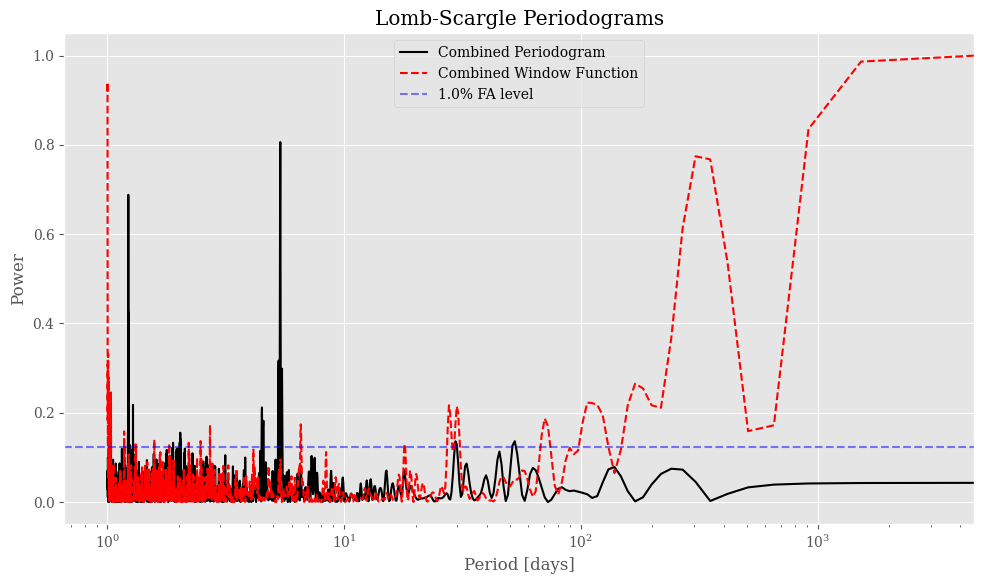

In [78]:
rv.plot_lombscargle_periodograms(data.t_rv, data.y_rv, data.yerr_rv, combined = True)

# Activity indicators

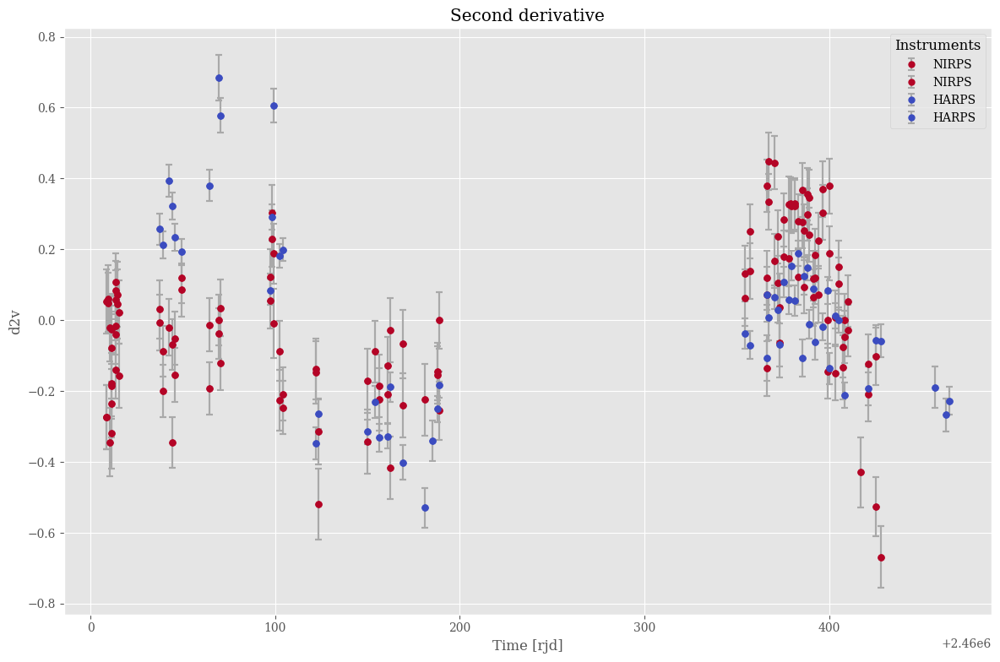

In [79]:
# Plot the chosen activity indicator
nfigs = 2 - data.no_Dtemp
fig, axes = plt.subplots(nfigs, 1, figsize=(12, 8), sharex=True)

for idx, instrument in enumerate(data.instruments):
    # Subtler error bars
    axes.errorbar(data.t_rv[instrument], data.d2v[instrument], yerr=data.sd2v[instrument], fmt='o', 
                label=instrument, color=colors[idx], 
                ecolor='darkgray', elinewidth=1.5, capsize=3, capthick=1.5)
    if not data.no_Dtemp:
        axes[0].errorbar(data.t_rv[instrument], data.d2v[instrument], yerr=data.sd2v[instrument], fmt='o', 
                label=instrument, color=colors[idx], 
                ecolor='darkgray', elinewidth=1.5, capsize=3, capthick=1.5)
        axes[1].errorbar(data.t_rv[instrument], data.Dtemp[instrument], yerr=data.sDtemp[instrument], fmt='o',
                        label=instrument, color=colors[idx], 
                    ecolor='darkgray', elinewidth=1.5, capsize=3, capthick=1.5)

        axes[1].set_xlabel('Time [rjd]')
        axes[0].set_ylabel('d2v')
        axes[0].legend(title='Instruments')
        axes[0].set_title('Second derivative')

        axes[1].set_title('Differential temperature')
        axes[1].legend(title='Instruments')
        axes[1].set_ylabel('Dtemp')
    else: 
        axes.errorbar(data.t_rv[instrument], data.d2v[instrument], yerr=data.sd2v[instrument], fmt='o', 
                label=instrument, color=colors[idx], 
                ecolor='darkgray', elinewidth=1.5, capsize=3, capthick=1.5)
        axes.set_xlabel('Time [rjd]')
        axes.set_ylabel('d2v')
        axes.legend(title='Instruments')
        axes.set_title('Second derivative')
plt.show()

Choose the activity indicator

In [80]:
if data.activity_priors['chosen_activity'] == 'd2v': 
    act, sact = data.d2v, data.sd2v

if data.activity_priors['chosen_activity'] == 'Dtemp': 
    act, sact = data.Dtemp, data.sDtemp
    
print(f'You chose to use the {data.activity_priors["chosen_activity"]} activity indicator.')

You chose to use the d2v activity indicator.


## Creating the GP object

GP params order: 

0. `mu` (offset)
1. `log_wn` (jitter noise)
2. `log_amp` (amplitude)
3. `log_lambda` (Coherence length)
4. `gamma` (Number of sub-structures)
5. `log_Prot` (Rotation period)

First Guess

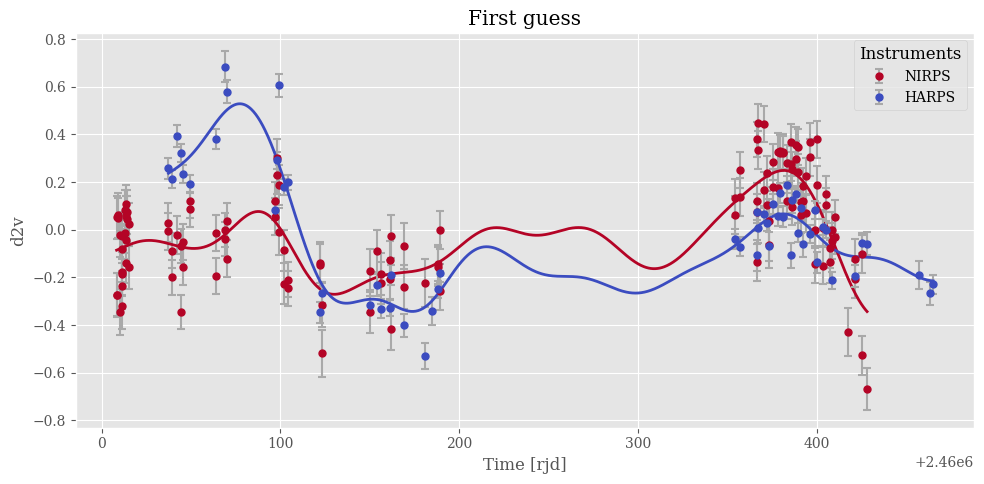

In [81]:
act_gp = {} # Dictionary to store the GP for each instrument
p0 = {} # Dictionary to store the initial guess for the hyperparameters

for instrument in data.instruments: 
    
    p0[instrument] = rv.juliet_to_george([np.mean(act[instrument]), 0.1, np.std(act[instrument]),
           data.activity_priors['GP_length']['guess'], data.activity_priors['GP_gamma']['guess'], data.activity_priors['GP_Prot']['guess']]) # Initial guess for the hyperparameters
    
    act_gp[instrument] = rv.QP_GP_Model(p0[instrument], data.t_rv[instrument], act[instrument], sact[instrument])
# Plot the first guess
# Plot the chosen activity indicator
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
                    
for idx, instrument in enumerate(data.instruments):
    # Subtler error bars
    ax.errorbar(data.t_rv[instrument], act[instrument], yerr=sact[instrument], fmt='o', 
                label=instrument, color=colors[idx], 
                ecolor='darkgray', elinewidth=1.5, capsize=3, capthick=1.5)
    ax.plot(data.t_mod[instrument], act_gp[instrument].predict(data.t_mod[instrument]), color=colors[idx], lw=2)

ax.set_xlabel('Time [rjd]')
ax.set_ylabel(data.activity_priors['chosen_activity'])
ax.legend(title='Instruments')
ax.set_title('First guess')
plt.show()

## Combining the shared parameters and computing initial guess

In [82]:
p0_separated = []

for instrument in data.instruments: 
    p0_separated += list(p0[instrument])

p0_vect = rv.params_vector(p0_separated, data.instruments, i_shared, num_planets = data.nplanets, gp_only=True)

comb_p0 = p0_vect.combine()

## Running `emcee`

In [83]:
# MCMC fit of the GP hyperparameters 
nwalkers, ndim = 32, len(comb_p0)
num_warmup = 600
num_post_samples = 2500
sampler = emcee.EnsembleSampler(
    nwalkers,
    ndim,
    rv.emcee_act_log_post,
    args=(act_gp, act, data, i_shared),
    # moves=[emcee.moves.StretchMove()]
    moves=[emcee.moves.DEMove()],
)
# Change the dimension of p0 with the number of walkers
comb_p0_emcee = np.array([comb_p0 + 1e-6 * np.random.randn(ndim) for i in range(nwalkers)])

$\color{red}{\textrm{RUNNING CELL}}$

In [84]:
if data.run_activity == True:
    print('Running MCMC fit for the activity indicator...')
    sampler.run_mcmc(comb_p0_emcee, num_post_samples + num_warmup, progress=True, store=True)
    act_post_samples = sampler.get_chain(discard=num_warmup)
    np.save(f'stars/{star}/full_analysis/activity/act_post_samples.npy', act_post_samples)
    print('Done')

else: 
    print('Loading previous MCMC fit for the activity indicator...')

Loading previous MCMC fit for the activity indicator...


Load the already ran target

In [85]:
act_post_samples = np.load(f'stars/{star}/full_analysis/activity/act_post_samples.npy', allow_pickle=True)

Traceplot

Plotting traceplot...


Done.


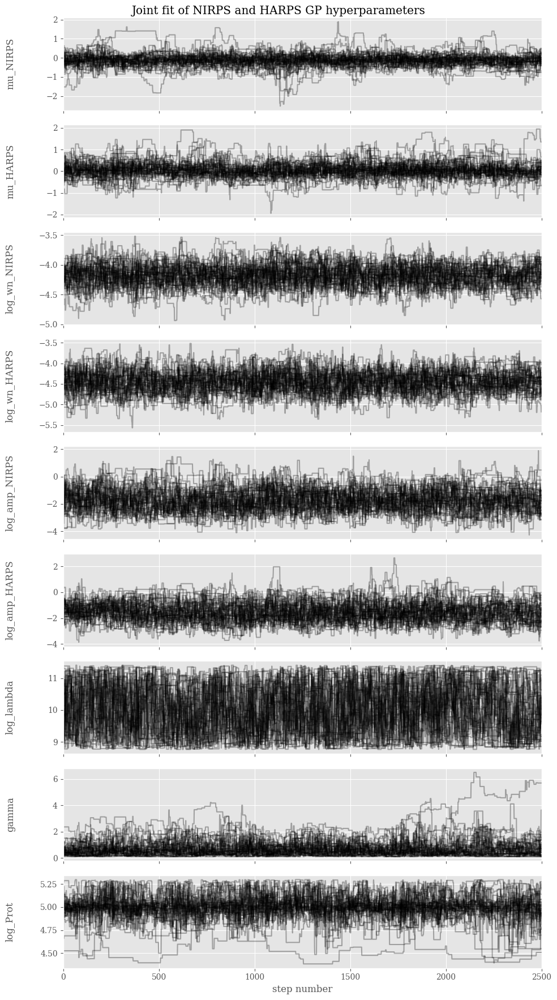

In [86]:
print('Plotting traceplot...')
fig, axes = plt.subplots(ndim, figsize=(10, ndim*2), sharex=True)


for i in range(ndim):
    ax = axes[i]
    ax.plot(act_post_samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(act_post_samples))
    ax.yaxis.set_label_coords(-0.1, 0.5)
    ax.set_ylabel(gp_labels[i])
axes[-1].set_xlabel("step number")
plt.suptitle('Joint fit of NIRPS and HARPS GP hyperparameters')
plt.savefig(f"stars/{star}/full_analysis/activity/act_GP_traceplot.png")
print('Done.')

Corner plot

Creating corner plot for the activity indicator


Done.


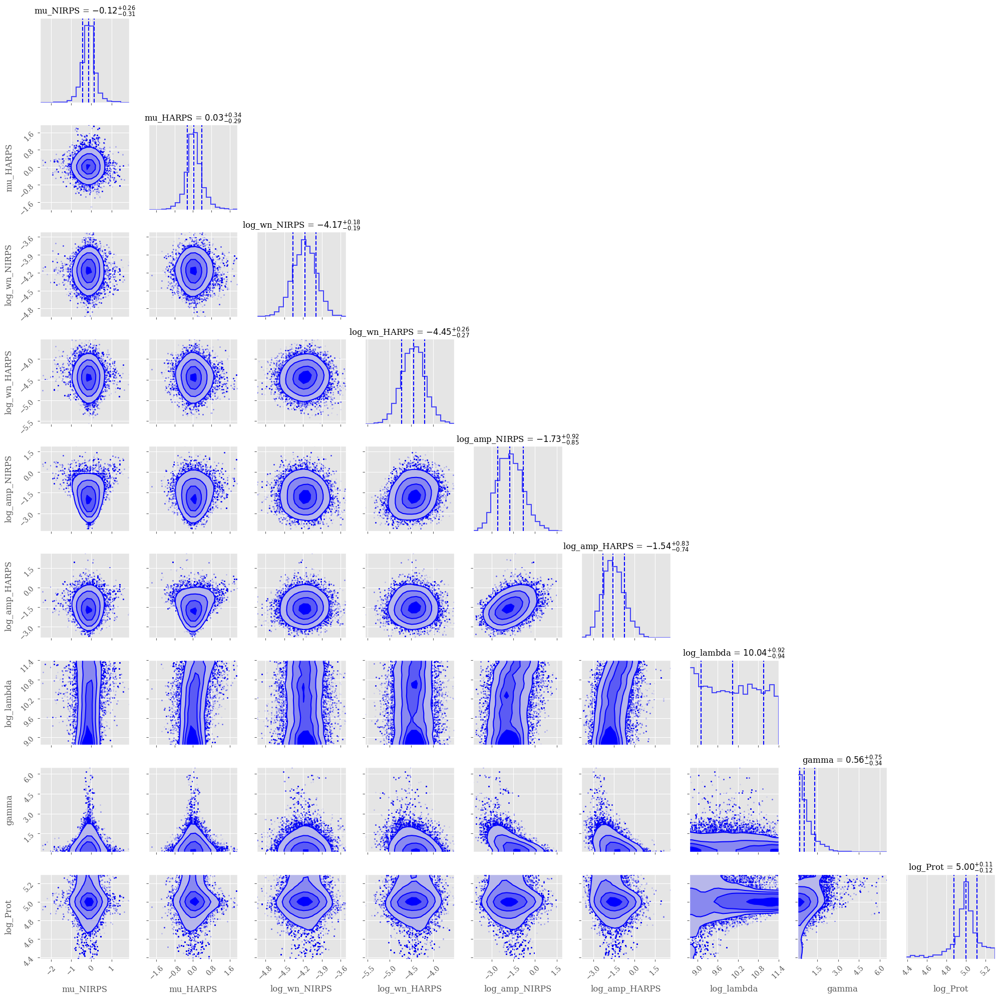

In [87]:
print('Creating corner plot for the activity indicator')
#truths = [None, None, None, None, None, None, None, None, np.log(data.data['star']['period'])]

corner.corner(act_post_samples.reshape(-1, ndim), quantiles=[0.16, 0.5, 0.84],
              show_titles=True,
              title_kwargs={"fontsize": 12},
              color="blue",  # Set a color scheme (optional)
              hist_kwargs={"linewidth": 1.5, "alpha": 0.7},  # Adjust histogram appearance
              fill_contours=True,  # Show contours for data density
              fill_kw={"cmap": "Blues"},  # Set colormap for contours (optional)
              smooth=True,  # Improve smoothness of contours
              fontsize=10,  # Set font size for labels and tick marks
              #truths=truths,
              #truth_color = 'orange',
              labels=gp_labels
)
plt.tight_layout()
plt.savefig(f"stars/{star}/full_analysis/activity/act_GP_cornerplot.png")
print('Done.')

In [88]:
median_likelihood_params = np.median(act_post_samples, axis=(0,1))
_, act_med_params = rv.separate_gp_params(median_likelihood_params, i_shared, act_gp.keys())

print(f"Median likelihood parameters")
print('--------------------------')
# Show the median likelihood parameters
for i, label in enumerate(gp_labels):
    print(f'{label}: {median_likelihood_params[i]:.3f}')


Median likelihood parameters
--------------------------
mu_NIRPS: -0.124
mu_HARPS: 0.032
log_wn_NIRPS: -4.173
log_wn_HARPS: -4.452
log_amp_NIRPS: -1.733
log_amp_HARPS: -1.545
log_lambda: 10.036
gamma: 0.560
log_Prot: 5.000


Creating posterior samples

In [89]:
# Visualize posterior samples and max/median likelihood models
print('Creating posterior samples...')

num_display = 20
maxiter = 100
niter = 0

# Initialize dictionaries to store posterior samples for each instrument
model_post_samples = {instrument: [] for instrument in act_gp.keys()}

while niter < maxiter and all(len(samples) < num_display for samples in model_post_samples.values()):
    w = np.random.randint(nwalkers)
    n = np.random.randint(num_post_samples)

    # Separate the parameters for each instrument
    _, act_post_samples_dict = rv.separate_gp_params(act_post_samples[n, w], i_shared, act_gp.keys())

    try:
        for instrument, gp_model in act_gp.items():
            gp_params = act_post_samples_dict[instrument]
            gp_model.gp.set_parameter_vector(gp_params)
            model_post_samples[instrument].append(gp_model.gp.sample_conditional(act[instrument], data.t_mod[instrument]))
    except LinAlgError:
        print("LinAlgError")
        print(f"iteration {niter}")
        print("GP hyperparameters:")
        for instrument, gp_model in act_gp.items():
            pprint.pprint(gp_model.gp.get_parameter_dict())
    
    niter += 1

# Convert lists to numpy arrays
model_post_samples = {instrument: np.array(samples) for instrument, samples in model_post_samples.items()}

print('Done.')

Creating posterior samples...


Done.


Plotting the best-fit results
Done.


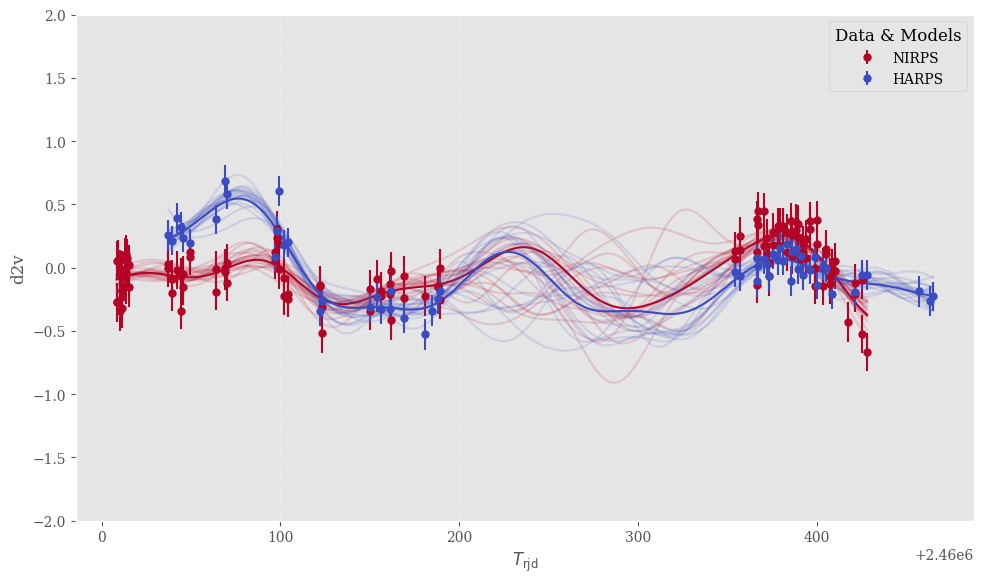

In [90]:
print('Plotting the best-fit results')

# Initialize dictionaries to store predictions and standard deviations
mu_med = {}
std_med = {}

# Predict for each instrument
for instrument, gp_model in act_gp.items():
    # Median likelihood parameters
    gp_model.gp.set_parameter_vector(act_med_params[instrument])
    mu_med[instrument], var_med = gp_model.gp.predict(act[instrument], data.t_mod[instrument], return_var=True)

# Plotting
fig, axes = plt.subplots(1, 1, figsize=(10, 6), sharex=True)
colors = cm.coolwarm(np.linspace(1, 0, len(act_gp)))  # Use coolwarm colormap for consistency

for idx, (instrument, color) in enumerate(zip(act_gp.keys(), colors)):
    # Plot data with error bars
    axes.errorbar(data.t_rv[instrument], act[instrument], yerr=np.sqrt(sact[instrument]**2 + np.exp(act_med_params[instrument][1])), 
                  fmt="o", ms=5, label=instrument, color=color)
    
    # Plot samples from posterior
    axes.plot(data.t_mod[instrument], model_post_samples[instrument].T, color=color, alpha=0.15)
    
    # Plot median likelihood
    axes.plot(data.t_mod[instrument], mu_med[instrument], color=color, linewidth=1.5)

# Axes and labels
axes.set_ylabel(f"{data.activity_priors['chosen_activity']}")
axes.set_xlabel(r"$T_{\rm rjd}$")  # Use Latex for unit

# Conditionally setting y-limits based on activity indicator
if data.activity_priors['chosen_activity'] == 'Dtemp': 
    plt.ylim(bottom=-50, top=50)
if data.activity_priors['chosen_activity'] == 'd2v': 
    plt.ylim(bottom=-2, top=2)

axes.grid(linestyle='--', alpha=0.3)
plt.legend(title="Data & Models", loc='upper right')  # Adjust legend position
plt.tight_layout()  # Adjust spacing

# Saving figure
star_name = data.data['star']['name']
file_path = f"stars/{star_name}/full_analysis/activity/{data.activity_priors['chosen_activity']}_GP_MC_fit.png"
plt.savefig(file_path, dpi=300)  # Ensure high resolution

print('Done.')


# Planets + GP analysis

## Exemple of the parameter vector to enter in the Planet_GP_Model object: 

p = [planets parameters, GP parameters]

**p = [per1, tc1, k1, ... (other planets), mu_NIRPS, noise_NIRPS, amp_NIRPS, coherence_length_NIRPS, gamma_NIRPS, Prot_NIRPS, ... (other instruments) ]**

### Loading the initial guess parameter vector

In [91]:
import importlib
importlib.reload(rv)

<module 'rv_analysis_tools' from '/home/plamontagne/nirps/rv_analysis_tools.py'>

In [92]:
# Extract the number of planets from the RV priors
num_planets = data.nplanets

print(f'Creating initial guess for the RV parameters for {num_planets} planets and activity...')

# Initialize lists to hold planet parameters and labels
p0 = []
planet_labels = []
priors = {}  # Dictionary to store the priors
prior_params_names = ['mu', 'noise', 'GP_sigma', 'GP_length', 'GP_gamma', 'GP_Prot']
act_samples_dict = rv.separate_gp_params_samples(act_post_samples, i_shared, data.instruments)  # Contains the samples for the parameters of each instrument

# Loop over the number of planets to construct the parameter and label lists
for i in range(1, num_planets + 1):
    p0.extend([
        data.RV_priors[f'per{i}']['guess'],
        data.RV_priors[f'tc{i}']['guess'],
        data.RV_priors[f'k{i}']['guess']
    ])
    planet_labels.extend([f'per{i}', f'tc{i}', f'k{i}'])

# Loop over the instruments to construct the GP parameter list
for inst in data.instruments: 
    priors[inst] = copy.deepcopy(data.RV_priors)
    
for instrument in data.instruments: 
    if data.use_indicator:
        # Create the initial vector from the activity indicator
        p0.extend(
            [np.mean(data.y_rv[instrument]), np.log(0.1**2), np.log(np.std(data.y_rv[instrument])**2),
            act_med_params[instrument][3], act_med_params[instrument][4], act_med_params[instrument][5]])
    
        # Add priors for GP parameters
        for idx, param_name in enumerate(prior_params_names):
            if param_name == 'GP_length':
                priors[instrument][param_name] = {
                    'guess': np.median(np.exp(act_samples_dict[instrument][idx])),
                    'distribution': 'TruncatedNormal',
                    'mean': np.median(np.sqrt(np.exp(act_samples_dict[instrument][idx]))),
                    'std': np.std(np.sqrt(np.exp(act_samples_dict[instrument][idx]))),
                    'min': data.RV_priors['GP_length']['min'],
                    'max': data.RV_priors['GP_length']['max']
                }
            elif param_name == 'GP_gamma':
                priors[instrument][param_name] = {
                    'guess': np.median(np.exp(act_samples_dict[instrument][idx])),
                    'distribution': 'TruncatedNormal',
                    'mean': np.median(act_samples_dict[instrument][idx]),
                    'std': np.std(act_samples_dict[instrument][idx]), 
                    'min': data.RV_priors['GP_gamma']['min'], 
                    'max': data.RV_priors['GP_gamma']['max']
                }
            elif param_name == 'GP_Prot':
                priors[instrument][param_name] = {
                    'guess': np.median(np.exp(act_samples_dict[instrument][idx])),
                    'distribution': 'TruncatedNormal',
                    'mean': np.median(np.exp(act_samples_dict[instrument][idx])),
                    'std': np.std(np.exp(act_samples_dict[instrument][idx])), 
                    'min': data.RV_priors['GP_Prot']['min'],
                    'max': data.RV_priors['GP_Prot']['max']
                }
            else: 
                continue

    else:
        p0.extend(rv.juliet_to_george([
            np.mean(data.y_rv[instrument]), 0.1, np.std(data.y_rv[instrument]),
            data.RV_priors['GP_length']['guess'], data.RV_priors['GP_gamma']['guess'], data.RV_priors['GP_Prot']['guess']
        ]))
        priors[instrument] = copy.deepcopy(data.RV_priors)

# Create parameter vector
p0_vect = rv.params_vector(p0, data.instruments, i_shared, num_planets=num_planets)
comb_p0 = p0_vect.combine()
param_labels = np.concatenate([planet_labels, gp_labels])

# Print priors
pd.options.display.float_format = '{:.3f}'.format
priors_list = []
for inst in priors:
    for param, param_priors in priors[inst].items():
        priors_list.append([inst, param, param_priors['guess'], param_priors['distribution'], param_priors.get('mean'), param_priors.get('std'), param_priors.get('min'), param_priors.get('max')])

priors_df = pd.DataFrame(priors_list, columns=['Instrument', 'Parameter', 'Guess', 'Distribution', 'Mean', 'Std', 'Min', 'Max'])
print('Priors:')
display(priors_df)


Creating initial guess for the RV parameters for 3 planets and activity...
Priors:


,Instrument,Parameter,Guess,Distribution,Mean,Std,Min,Max
0,NIRPS,mu,0.000,Uniform,0.000,5.000,-10.000,10.000
1,NIRPS,noise,1.000,Uniform,1.000,1.000,0.001,100.000
2,NIRPS,GP_Prot,148.342,TruncatedNormal,148.342,21.683,60.000,200.000
3,NIRPS,GP_sigma,1.000,Uniform,1.000,0.001,0.100,20.000
4,NIRPS,GP_length,22838.993,TruncatedNormal,151.126,63.028,60.000,300.000
5,NIRPS,GP_gamma,1.750,TruncatedNormal,0.560,0.707,0.100,10.000
6,NIRPS,per1,5.360,Normal,5.360,0.500,10.000,60.000
7,NIRPS,tc1,2454714.631,Uniform,2454724.631,3.000,2454704.631,2454724.631
8,NIRPS,k1,12.000,Uniform,1.300,1.000,0.000,15.000
9,NIRPS,per2,12.914,Normal,12.914,0.500,10.000,60.000


## Creating planet + GP model

In [93]:
# Create the Planet+GP model
model = rv.Planet_GP_Model(p0_vect, data.t_rv, data.y_rv, data.yerr_rv, num_planets = num_planets)
model.update_params(p0_vect)

Look at first guess

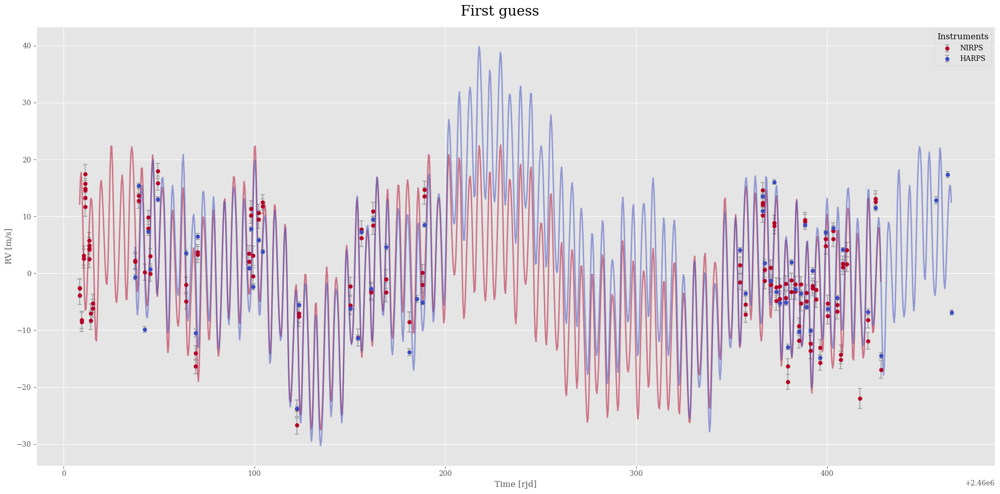

In [94]:
# Plot the RV data and the first guess
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
colors = cm.coolwarm(np.linspace(1, 0, len(data.instruments)))

for idx, instrument in enumerate(data.instruments):
    # Subtler error bars
    ax.errorbar(data.t_rv[instrument], data.y_rv[instrument], yerr=data.yerr_rv[instrument], fmt='o', 
                label=instrument, color=colors[idx], 
                ecolor='darkgray', elinewidth=1.5, capsize=3, capthick=1.5)
    ax.plot(data.t_mod[instrument], model.predict(data.t_mod)[instrument], color=colors[idx], lw=2, alpha=0.5)
    
    ax.set_xlabel('Time [rjd]')
    ax.set_ylabel('RV [m/s]')
    
    ax.legend(title='Instruments')
plt.suptitle('First guess', fontsize=20)
plt.show()
    

## Run `emcee`

### Creating a combined parameter vector to use in the MCMC run
This is necessary because we want the shared GP parameters to be updated for all instruments at once.

In [95]:
if data.sampler == "emcee":
    # MCMC fit of the GP hyperparameters 
    nwalkers, ndim = 3*len(comb_p0), len(comb_p0)
    num_warmup = 100 * ndim
    num_post_samples = 1000 * ndim
    sampler = emcee.EnsembleSampler(
        nwalkers,
        ndim,
        rv.emcee_log_post,
        args=(model, data, priors, i_shared, num_planets),
        moves=[emcee.moves.DEMove()]
    )
    # Change the dimension of p0 with the number of walkers
    comb_p0_emcee = np.array([comb_p0 + np.random.randn(ndim) * 1e-4 for i in range(nwalkers)])

    if data.run_RV == True:
        print('Running MCMC for the combined model...')
        sampler.run_mcmc(comb_p0_emcee, num_post_samples + num_warmup, progress=True) # Run the MCMC
        
        # Save the samples
        post_samples = sampler.get_chain(discard=num_warmup)
        post_samples = post_samples.reshape(-1, post_samples.shape[2]) # Remove the walkers dimension
        np.save(f'stars/{star}/full_analysis/planet/emcee/full_post_samples.npy', post_samples)
        
        # Save the log probabilities
        log_prob_samples = sampler.get_log_prob(discard=num_warmup)
        np.save(f'stars/{star}/full_analysis/planet/emcee/full_log_prob_samples.npy', log_prob_samples) 
        
        print('Done.')
        
    else: 
        print('Loading previous MCMC fit for the combined model...')

## Run `dynesty`

In [96]:
if data.sampler == 'dynesty': 
    # Set up the Nested Sampler
    ndim = len(comb_p0)

    # Define parameters in relation to ndim
    n_live_points = 10 * ndim  # Number of live points, typically 10 * ndim
    dlogz = 0.1  # Stopping criteria for the evidence
    maxiter = 5000 * ndim  # Maximum number of iterations
    num_warmup = 100 * ndim

    if data.run_RV: 
        sampler = dynesty.NestedSampler(rv.dynesty_log_likelihood, rv.dynesty_prior_transform, ndim, 
                                        nlive=n_live_points, 
                                        logl_args=(model, i_shared, data, num_planets), 
                                        ptform_args=(priors, model, i_shared, data, num_planets))

        # Run the Nested Sampler
        sampler.run_nested(dlogz=dlogz, maxiter=maxiter)
        results = sampler.results
        all_log_prob_samples = results.logl
        
        # Smooth the log-probability curve using a moving average
        window_size = 50
        smoothed_log_prob = np.convolve(all_log_prob_samples, np.ones(window_size)/window_size, mode='valid')

        # Calculate the derivative of the smoothed log-probability
        derivative_log_prob = np.diff(smoothed_log_prob)

        # Identify the point where the derivative falls below a threshold and stays there
        threshold = 0.01
        burn_in = next((i for i, v in enumerate(derivative_log_prob) if v < threshold), 0) + window_size

        print(f"Determined burn-in period: {burn_in}")

        # Gather the results: samples and log_prob of all samples
        samples = results.samples[burn_in:]  # Array of shape (nsamples, ndim)
        np.save(f'stars/{star}/full_analysis/planet/dynesty/full_post_samples.npy', samples)
        
        log_prob = results.logl[burn_in:]  # Log-likelihood values for each sample
        np.save(f'stars/{star}/full_analysis/planet/dynesty/full_log_prob_samples.npy', log_prob)


        # Extract the evidence (logZ) and its uncertainty (logZerr)
        log_evidence = results.logz[-1]
        log_evidence_err = results.logzerr[-1]
        evidence_filename = f'stars/{star}/full_analysis/planet/dynesty/log_evidence_{num_planets}_planets_i_shared_{i_shared}.txt'
        np.savetxt(evidence_filename, np.array([[log_evidence, log_evidence_err]]), header="log_evidence log_evidence_err", fmt='%.6f')
    
    else: 
        print('Loading previous Nested Sampling fit for the planet + GP model...')
    

71it [00:00, 97.36it/s, bound: 0 | nc: 4 | ncall: 265 | eff(%): 26.792 | loglstar:   -inf < -13789.851 <    inf | logz: -13796.130 +/-  0.187 | dlogz: 13465.962 >  0.100] 

13944it [57:54,  4.01it/s, +180 | bound: 518 | nc: 1 | ncall: 512105 | eff(%):  2.759 | loglstar:   -inf < -443.359 <    inf | logz: -518.345 +/-  0.584 | dlogz:  0.001 >  0.100]


Determined burn-in period: 3196


Loading the already ran target

In [97]:
post_samples = np.load(f"stars/{star}/full_analysis/planet/{data.sampler}/full_post_samples.npy")
log_prob_samples = np.load(f"stars/{star}/full_analysis/planet/{data.sampler}/full_log_prob_samples.npy")

Plotting traceplot...


Done.


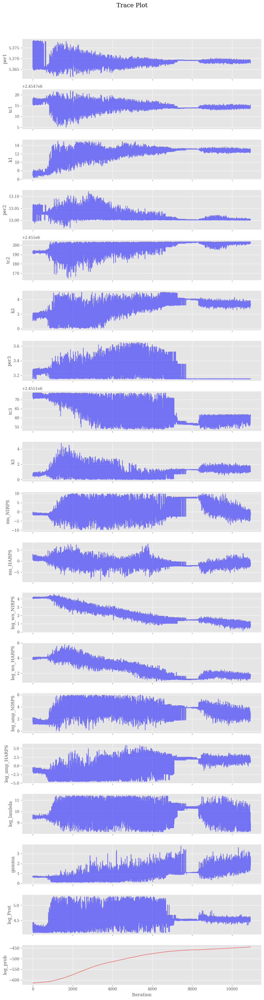

In [98]:
if data.sampler == 'emcee':  
    print('Plotting traceplot...')

    fig, axes = plt.subplots(ndim, figsize=(10, ndim*2), sharex=True)

    for i in range(ndim):
        ax = axes[i]
        ax.plot(post_samples[:, i], "k", alpha=0.3)
        ax.set_xlim(0, len(post_samples))
        ax.yaxis.set_label_coords(-0.1, 0.5)
        ax.set_ylabel(param_labels[i])
    axes[-1].set_xlabel("step number")
    plt.suptitle('Joint fit of NIRPS and HARPS planet + GP')
    plt.savefig(f"stars/{star}/full_analysis/planet/emcee/planet+GP_traceplot.png")

    print('Done.')

elif data.sampler == 'dynesty': 
    print('Plotting traceplot...')
    
    # Number of parameters
    ndim = len(comb_p0)

    # Create a figure for the trace plot
    fig, axes = plt.subplots(ndim + 1, 1, figsize=(10, 2 * (ndim + 1)), sharex=True)

    # Plot each parameter
    for i in range(ndim):
        axes[i].plot(post_samples[:, i], color='blue', alpha=0.5)
        axes[i].set_ylabel(param_labels[i])
        axes[i].grid(True)

    # Plot the log probability
    axes[ndim].plot(log_prob_samples, color='red', alpha=0.5)
    axes[ndim].set_ylabel('log_prob')
    axes[ndim].set_xlabel('Iteration')
    axes[ndim].grid(True)

    # Add a title to the figure
    fig.suptitle('Trace Plot', fontsize=16)

    # Adjust layout to avoid overlap
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    plt.savefig(f"stars/{star}/full_analysis/planet/dynesty/planet+GP_traceplot.png")
    
    print('Done.')
    
else: 
    print('The selected sampler is not valid')

In [99]:
# # Generate the corner plot
# fig, axes = dyplot.cornerplot(results, show_titles=True, title_kwargs={'fontsize': 12})

# # Add a title to the figure
# fig.suptitle('Corner Plot', fontsize=16)

# # Adjust layout
# plt.tight_layout()

Plotting corner plot...


Done.


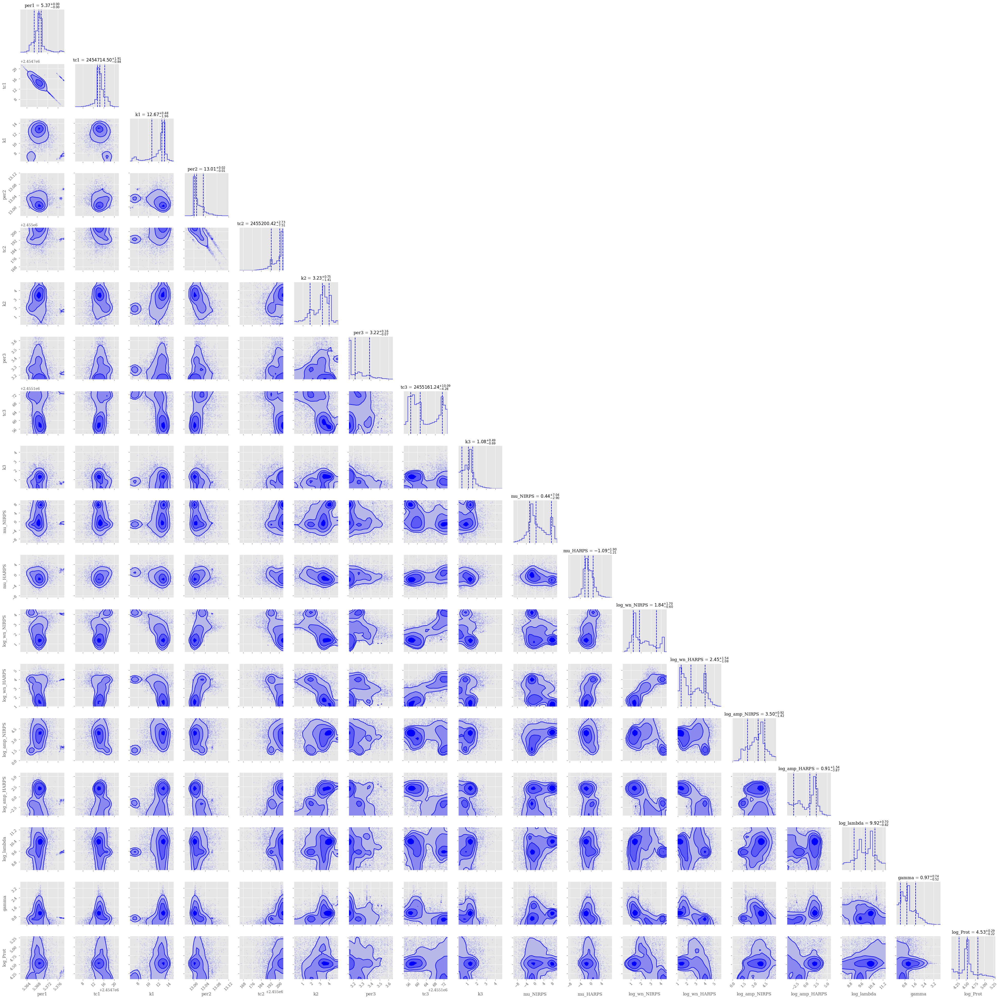

In [100]:
print('Plotting corner plot...')

# Make a corner plot
fig = corner.corner(
    post_samples,
    labels=param_labels,
    quantiles=[0.16, 0.5, 0.84],
    show_titles=True,
    title_kwargs={"fontsize": 12},
    color="blue",  # Set a color scheme (optional)
    hist_kwargs={"linewidth": 1.5, "alpha": 0.7},  # Adjust histogram appearance
    fill_contours=True,  # Show contours for data density
    fill_kw={"cmap": "Blues"},  # Set colormap for contours (optional)
    smooth=True,  # Improve smoothness of contours
    fontsize=10,  # Set font size for labels and tick marks
    truth_color = 'orange',
)

plt.tight_layout()
plt.savefig(f"stars/{star}/full_analysis/planet/{data.sampler}/planet+GP_cornerplot.png")

print('Done.')

In [121]:
# Get the best parameters
med_params = np.median(post_samples.flatten().reshape(-1, ndim), axis=0)
max_params = rv.get_max_likelihood_params(post_samples.flatten().reshape(-1, ndim), log_prob_samples.flatten())

# Get the uncertainty
errors = np.percentile(post_samples.flatten().reshape(-1, ndim), [16, 84], axis=0)

print('Median likelihood parameters')
print('--------------------------')
# Show the median likelihood parameters
with open(f"stars/{star}/full_analysis/planet/{data.sampler}/median_likelihood_params.txt", "w") as text_file:
    for i, label in enumerate(param_labels):
        print(f'{label}: {med_params[i]:.3f} - {errors[0][i]:.3f} + {errors[1][i]:.3f}')
        text_file.write(f'{label}: {med_params[i]:.3f} - {errors[0][i]:.3f} + {errors[1][i]:.3f}\n')
    
print('Maximum likelihood parameters')
print('--------------------------')
# Show the maximum likelihood parameters
with open(f"stars/{star}/full_analysis/planet/{data.sampler}/maximum_likelihood_params.txt", "w") as text_file:
    for i, label in enumerate(param_labels):
        print(f'{label}: {max_params[i]:.3f} - {errors[0][i]:.3f} + {errors[1][i]:.3f}')
        text_file.write(f'{label}: {max_params[i]:.3f} - {errors[0][i]:.3f} + {errors[1][i]:.3f}\n')

Median likelihood parameters
--------------------------
per1: 5.369 - 5.367 + 5.370
tc1: 2454714.499 - 2454713.662 + 2454716.413
k1: 12.665 - 10.701 + 13.148
per2: 13.010 - 13.002 + 13.033
tc2: 2455200.417 - 2455192.902 + 2455203.150
k2: 3.229 - 1.823 + 3.983
per3: 3.223 - 3.151 + 3.384
tc3: 2455161.241 - 2455156.965 + 2455171.326
k3: 1.078 - 0.391 + 1.564
mu_NIRPS: 0.439 - -2.461 + 7.480
mu_HARPS: -1.087 - -2.297 + 0.811
log_wn_NIRPS: 1.838 - 1.236 + 3.535
log_wn_HARPS: 2.455 - 1.373 + 3.999
log_amp_NIRPS: 3.495 - 2.074 + 4.413
log_amp_HARPS: 0.906 - -2.967 + 2.446
log_lambda: 9.918 - 9.096 + 10.620
gamma: 0.967 - 0.443 + 1.707
log_Prot: 4.532 - 4.313 + 4.820
Maximum likelihood parameters
--------------------------
per1: 5.369 - 5.367 + 5.370
tc1: 2454714.517 - 2454713.662 + 2454716.413
k1: 12.953 - 10.701 + 13.148
per2: 13.003 - 13.002 + 13.033
tc2: 2455202.565 - 2455192.902 + 2455203.150
k2: 3.250 - 1.823 + 3.983
per3: 3.149 - 3.151 + 3.384
tc3: 2455161.139 - 2455156.965 + 2455171.3

Choose between median or maximum parameters

In [102]:
best_params = np.copy(max_params)
#best_params = np.copy(med_params)

In [103]:
# Visualize posterior samples and max/median likelihood models
print('Creating posterior samples...')

num_display = 50
maxiter = 100
niter = 0

# Initialize dictionaries to store posterior samples for each instrument
model_post_samples = {instrument: [] for instrument in data.instruments}

while niter < maxiter and all(len(samples) < num_display for samples in model_post_samples.values()):
    n = np.random.randint(len(post_samples))

    # Separate the parameters for each instrument
    planet_sample = post_samples[n, :3*num_planets]
    gp_sample = post_samples[n, 3*num_planets:]
        
    gp_samples, gp_samples_dict = rv.separate_gp_params(gp_sample, i_shared, data.instruments)
    try:
        params = np.concatenate([planet_sample, gp_samples])
        model.update_params(params)
        
        for instrument in data.instruments:
            model_post_samples[instrument].append(model.predict(data.t_mod)[instrument])
            
    except LinAlgError:
        print("LinAlgError")
        print(f"iteration {niter}")
        print("GP hyperparameters:")
        for instrument, gp_model in act_gp.items():
            pprint.pprint(gp_model.gp.get_parameter_dict())
    
    niter += 1

# Convert lists to numpy arrays
model_post_samples = {instrument: np.array(samples) for instrument, samples in model_post_samples.items()}

print('Done')

Creating posterior samples...


Done


Plot the final the planets + GP model

In [104]:
# Separate the parameters for each instrument
best_gp_params, best_gp_params_dict = rv.separate_gp_params(med_params[3*num_planets:], i_shared, data.instruments)
separated_best_params = np.concatenate([best_params[:data.nplanets*3], best_gp_params])

# Update the model with the median likelihood parameters
model.update_params(separated_best_params)

# Fetch the noise term of each instrument
noise_terms = {instrument: np.sqrt(data.yerr_rv[instrument]**2 + np.exp(best_gp_params_dict[instrument][1])) for instrument in data.instruments}

Plotting the best-fit model and residuals


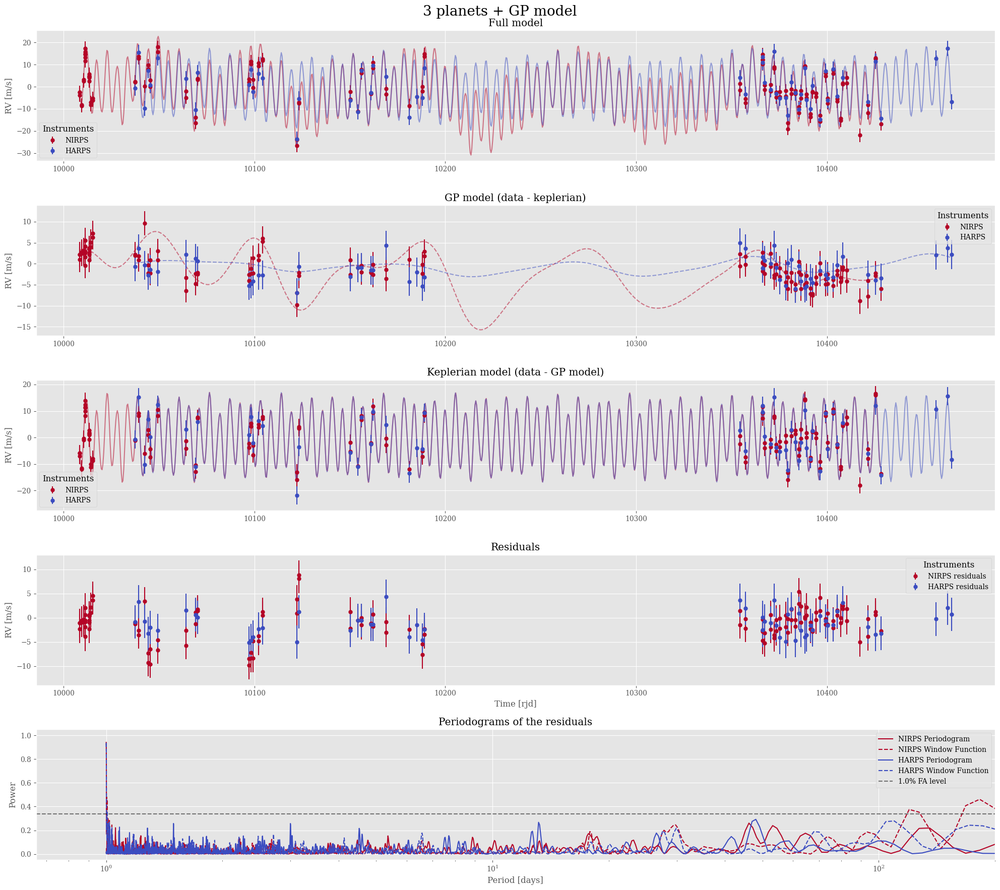

Done.


In [106]:
print('Plotting the best-fit model and residuals')

# Plot the planets + GP model and the samples
fig, axes = plt.subplots(5, 1, figsize=(20, 18), sharex=False)
colors = cm.coolwarm(np.linspace(1, 0, len(data.instruments)))
rjd_off = 2450000

# Dictionnaries to store the model predictions
planet_mod_pred_on_data = {}
planet_mod_pred_on_mod_times = {}
gp_mod_pred_on_data = {}
gp_mod_pred_on_mod_times = {}

# RV offset for each instrument
rv_offset = {}


for idx, instrument in enumerate(data.instruments):
    rv_offset[instrument] = best_params[3*num_planets+idx]
    planet_mod_pred_on_data[instrument] = model.predict(data.t_rv, return_components=True)[instrument]['planet']
    gp_mod_pred_on_data[instrument] = model.predict(data.t_rv, return_components=True)[instrument]['GP']
    planet_mod_pred_on_mod_times[instrument] = model.predict(data.t_mod, return_components=True)[instrument]['planet']
    gp_mod_pred_on_mod_times[instrument] = model.predict(data.t_mod, return_components=True)[instrument]['GP']
    
    # Plot data with error bars
    axes[0].errorbar(data.t_rv[instrument] - rjd_off, data.y_rv[instrument] , yerr=noise_terms[instrument], fmt="o", ms=5, label=f'{instrument}', color=colors[idx])
    axes[1].errorbar(data.t_rv[instrument] - rjd_off, data.y_rv[instrument] - planet_mod_pred_on_data[instrument], yerr=noise_terms[instrument], fmt="o", ms=5, label=f'{instrument}', color=colors[idx])
    axes[2].errorbar(data.t_rv[instrument] - rjd_off, data.y_rv[instrument] - gp_mod_pred_on_data[instrument], yerr=noise_terms[instrument], fmt="o", ms=5, label=f'{instrument}', color=colors[idx])
    
    # Plot best likelihood
    axes[2].plot(data.t_mod[instrument] - rjd_off, planet_mod_pred_on_mod_times[instrument], color=colors[idx],
                 linewidth=1.5, alpha=0.5)  # Keplerian
    axes[1].plot(data.t_mod[instrument] - rjd_off, gp_mod_pred_on_mod_times[instrument], color=colors[idx],
                 linestyle='--', linewidth=1.5, alpha=0.5)  # GP
    axes[0].plot(data.t_mod[instrument] - rjd_off, planet_mod_pred_on_mod_times[instrument] + gp_mod_pred_on_mod_times[instrument],
                 color=colors[idx], linewidth=1.5, alpha=0.5)  # Full model
    # Plot residuals
    axes[3].errorbar(data.t_rv[instrument] - rjd_off, data.y_rv[instrument] - planet_mod_pred_on_data[instrument] - gp_mod_pred_on_data[instrument], yerr=noise_terms[instrument], fmt='o', color=colors[idx], label=f'{instrument} residuals')
    
    # Plot the periodogram of the residuals
    ls = LombScargle(data.t_rv[instrument] - rjd_off, data.y_rv[instrument] - planet_mod_pred_on_data[instrument] - gp_mod_pred_on_data[instrument], dy=noise_terms[instrument])
    target_fap = 0.01
    fap = ls.false_alarm_level(target_fap)
    freq, power = ls.autopower(maximum_frequency=1.0)
    period = 1 / freq

    ls_window = LombScargle(data.t_rv[instrument] - rjd_off, np.ones_like(data.y_rv[instrument]), dy=noise_terms[instrument], fit_mean=False, center_data=False)
    power_window = ls_window.power(freq)

    axes[4].plot(period, power, color=colors[idx], label=f'{instrument} Periodogram')
    axes[4].plot(period, power_window, color=colors[idx], linestyle='--', label=f'{instrument} Window Function')

axes[4].axhline(fap, linestyle="--", color="black", label=f"{target_fap * 100}% FA level", alpha=0.5)

axes[0].set_title('Full model')
axes[1].set_title('GP model (data - keplerian)')
axes[2].set_title('Keplerian model (data - GP model)')
axes[3].set_title('Residuals')
axes[4].set_title('Periodograms of the residuals')
axes[3].set_xlabel('Time [rjd]')
axes[0].set_ylabel('RV [m/s]')
axes[1].set_ylabel('RV [m/s]')
axes[2].set_ylabel('RV [m/s]')
axes[3].set_ylabel('RV [m/s]')
axes[0].legend(title='Instruments')
axes[1].legend(title='Instruments')
axes[2].legend(title='Instruments')
axes[3].legend(title='Instruments')
axes[4].set_xlabel('Period [days]')
axes[4].set_ylabel('Power')
axes[4].legend()
axes[4].set_xscale('log')
axes[4].set_xlim(0, 200)
plt.suptitle(f'{num_planets} planets + GP model', fontsize=20)
plt.savefig(f'stars/{star}/full_analysis/planet/{data.sampler}/planets+GP_best_fit.png')
plt.show()

print('Done.')

RMS of the residuals

In [107]:
# Print the RMS of the residuals
rms = np.sqrt(np.mean([np.sum((np.abs(data.y_rv[instrument] - planet_mod_pred_on_data[instrument] - gp_mod_pred_on_data[instrument]))**2) for instrument in data.instruments]))

print(f'RMS of the residuals: {rms:.3f} m/s')

# Print the median residual value
median_residual = np.median([np.median(np.abs(data.y_rv[instrument] - planet_mod_pred_on_data[instrument] - gp_mod_pred_on_data[instrument])) for instrument in data.instruments])
print(f'Median residual value: {median_residual:.3f} m/s')

RMS of the residuals: 31.172 m/s
Median residual value: 1.884 m/s


Plotting the random samples 

Plotting model samples


Done.


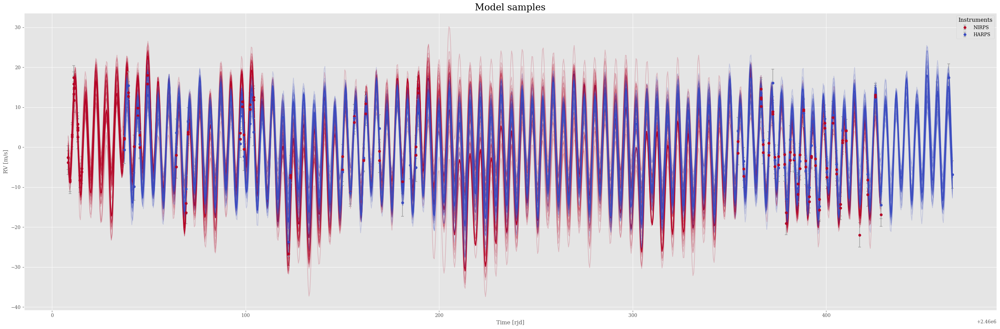

In [108]:
print('Plotting model samples')

fig, ax = plt.subplots(1, 1, figsize=(30, 10))

for idx, instrument in enumerate(data.instruments):
    # Subtler error bars
    ax.errorbar(data.t_rv[instrument], data.y_rv[instrument], yerr=noise_terms[instrument], fmt='o', 
                label=instrument, color=colors[idx], 
                ecolor='darkgray', elinewidth=1.5, capsize=3, capthick=1.5)
    ax.plot(data.t_mod[instrument], model_post_samples[instrument].T, alpha = 0.2, color = colors[idx])
    ax.plot(data.t_mod[instrument], model.predict(data.t_mod)[instrument], color=colors[idx], lw=2)
    
ax.set_xlabel('Time [rjd]')
ax.set_ylabel('RV [m/s]')
ax.legend(title='Instruments')
ax.set_title('Model samples', fontsize = 20)

plt.savefig(f'stars/{star}/full_analysis/planet/{data.sampler}/planet_model_samples.png')
print('Done.')

Plotting phase-folded RV curves of our planets...


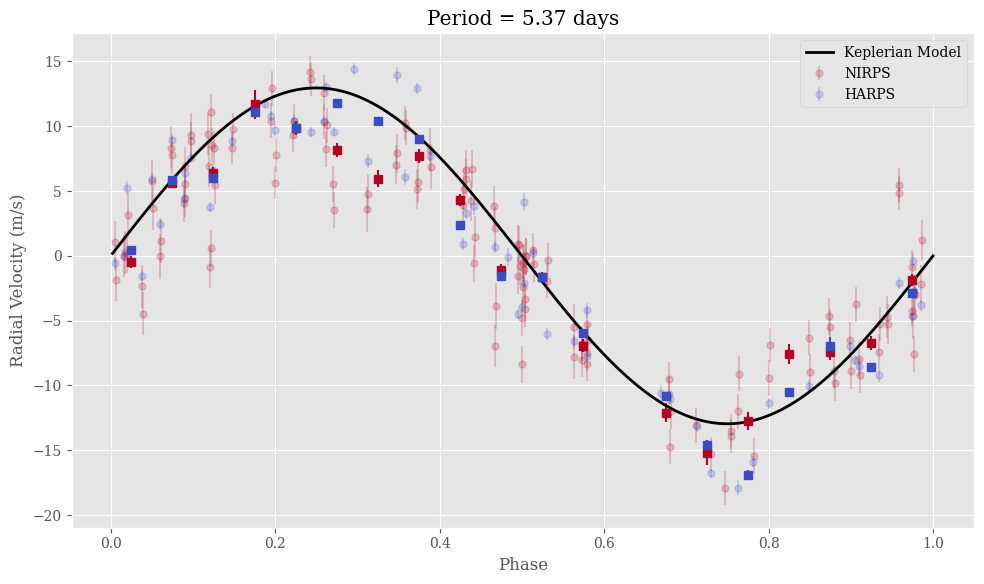

<Figure size 640x480 with 0 Axes>

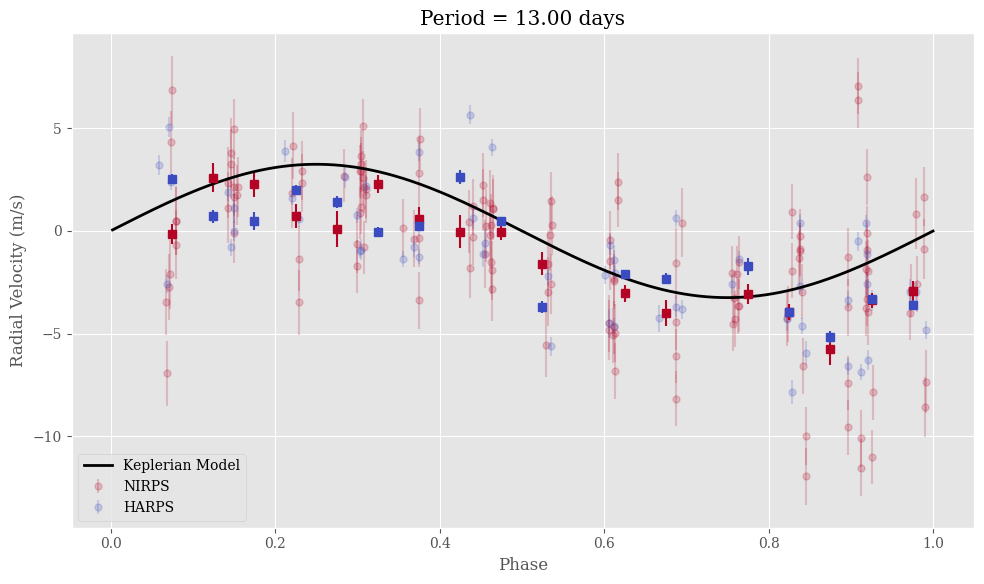

<Figure size 640x480 with 0 Axes>

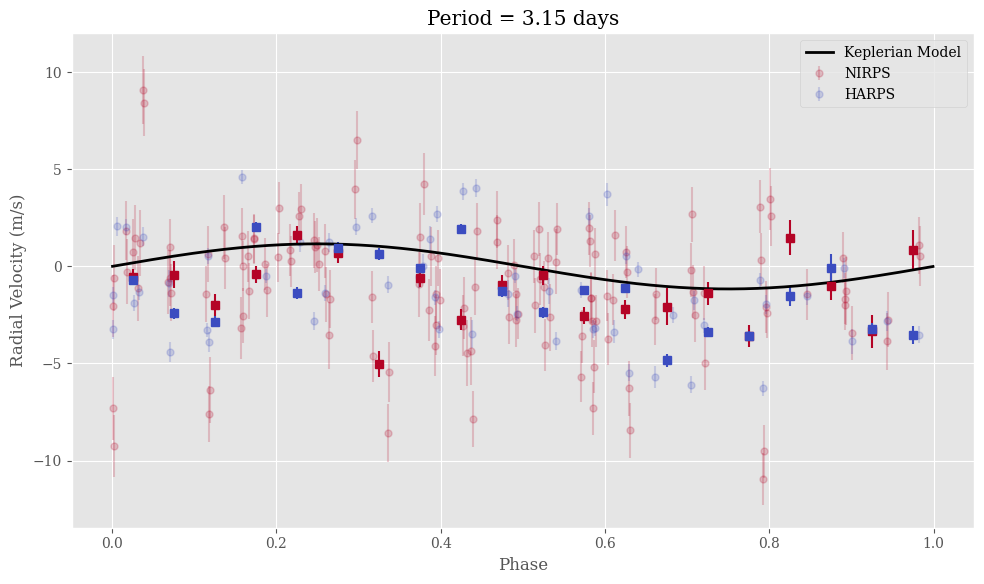

Done.


<Figure size 640x480 with 0 Axes>

In [113]:
print('Plotting phase-folded RV curves of our planets...')

def foldAt(time, period, t0):
    return ((time - t0 + 0.5 * period) % period) / period

def bin_data(phases, RVs, RV_errs, num_bins=20):
    bins = np.linspace(0, 1, num_bins + 1)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])
    binned_RVs = np.zeros(num_bins)
    binned_errs = np.zeros(num_bins)
    
    for i in range(num_bins):
        in_bin = (phases >= bins[i]) & (phases < bins[i+1])
        if np.any(in_bin):
            weights = 1 / RV_errs[in_bin]**2
            binned_RVs[i] = np.sum(RVs[in_bin] * weights) / np.sum(weights)
            binned_errs[i] = np.sqrt(1 / np.sum(weights))
        else:
            binned_RVs[i] = np.nan
            binned_errs[i] = np.nan
    
    return bin_centers, binned_RVs, binned_errs

def phase_folded_plot(data_times, model_times, RVs, RV_errs, keplerian_model_RVs, period, t0, instrument_names):
    colors = plt.cm.coolwarm(np.linspace(1, 0, len(data_times)))
    
    # Plotting the data
    plt.figure(figsize=(10, 6))
    
    for i, instrument in enumerate(instrument_names):
        # Fold the data and model times to get the phases
        phases_data = foldAt(data_times[instrument], period, t0)
        phases_model = foldAt(model_times[instrument], period, t0)

        # Sort the phases for plotting
        sort_indices_data = np.argsort(phases_data)
        sort_indices_model = np.argsort(phases_model)

        phases_data_sorted = phases_data[sort_indices_data]
        RV_sorted = RVs[instrument][sort_indices_data]
        
        phases_model_sorted = phases_model[sort_indices_model]
        keplerian_model_RVs_sorted = keplerian_model_RVs[instrument][sort_indices_model]

        # Plot the observed data
        plt.errorbar(phases_data_sorted, RV_sorted, yerr=RV_errs[instrument], fmt='o', color=colors[i], label=f'{instrument}', zorder=1, alpha = 0.2)
        
        # Bin the data and plot the binned points
        bin_centers, binned_RVs, binned_errs = bin_data(phases_data_sorted, RV_sorted, RV_errs[instrument][sort_indices_data])
        plt.errorbar(bin_centers, binned_RVs, yerr=binned_errs, fmt='s', color=colors[i], zorder=2, markersize = 6)
    
    # Plot the model
    plt.plot(phases_model_sorted, keplerian_model_RVs_sorted, color='black', label='Keplerian Model', lw=2)

    # Add labels and title
    plt.xlabel('Phase')
    plt.ylabel('Radial Velocity (m/s)')
    plt.title(f'Period = {period:.2f} days')
    plt.legend()
    plt.grid(True)
    
    # Show the plot
    plt.show()

# Loop through each planet and plot the data
for idx_planet in range(model.num_planets):
    planet_params = radvel.Parameters(1, basis='per tc secosw sesinw k')
    planet_params['per1'].value = best_params[3*idx_planet]
    planet_params['tc1'].value  = best_params[3*idx_planet+1]
    planet_params['k1'].value  = best_params[3*idx_planet+2]
    planet_params['secosw1'].value  = 0.0
    planet_params['sesinw1'].value  = 0.0

    # Create a Keplerian orbit model for the current planet
    radvel_model = radvel.RVModel(planet_params)

    data_times = {instrument: data.t_rv[instrument] for instrument in data.instruments}
    model_times = {instrument: data.t_mod[instrument] for instrument in data.instruments}
    
    # Subtract the GP model and other planets from the data
    RVs = {}
    for instrument in data.instruments:
        # Predict the RVs for the other planets
        other_planet_rvs = np.zeros_like(data.y_rv[instrument])
        for j in range(model.num_planets):
            if j != idx_planet:
                other_planet_params = radvel.Parameters(1, basis='per tc secosw sesinw k')
                other_planet_params['per1'].value = best_params[3*j]
                other_planet_params['tc1'].value = best_params[3*j+1]
                other_planet_params['k1'].value = best_params[3*j+2]
                other_planet_params['secosw1'].value = 0.0
                other_planet_params['sesinw1'].value = 0.0
                other_planet_model = radvel.RVModel(other_planet_params)
                other_planet_rvs += other_planet_model(data.t_rv[instrument])

        RVs[instrument] = data.y_rv[instrument] - model.predict(data.t_rv, return_components=True)[instrument]['GP'] - other_planet_rvs

    RV_errs = {instrument: data.yerr_rv[instrument] for instrument in data.instruments}
    keplerian_model_RVs = {instrument: radvel_model(data.t_mod[instrument]) for instrument in data.instruments}
    phase_folded_plot(data_times, model_times, RVs, RV_errs, keplerian_model_RVs, best_params[3*idx_planet], best_params[3*idx_planet+1], data.instruments)
    
    plt.savefig(f'stars/{star}/full_analysis/planet/{data.sampler}/phase_folded_planet_{idx_planet+1}.png')

print('Done.')


In [110]:
print('All done! Hope you will be happy with your results')

All done! Hope you will be happy with your results
